<a href="https://colab.research.google.com/github/Yagwar/Proyectos/blob/master/Linkdin_contacts.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import random
import time
%matplotlib inline
import matplotlib.animation as animation
matplotlib.style.use('seaborn')

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn import manifold
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster import hierarchy
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import pairwise_distances
from wordcloud import WordCloud
from sklearn.neighbors import kneighbors_graph

from mpl_toolkits.mplot3d import Axes3D

clrs_7=matplotlib.colors.LinearSegmentedColormap.from_list("", ['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#a65628'])#'#d9d9d9',

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')
files_route="gdrive/My Drive/Freelancer/linkedin contacts/"

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [3]:
dat=pd.read_csv(files_route+"Connections.csv")
print(dat.columns)
dat["Connected On"]=pd.to_datetime(dat["Connected On"])

Index(['First Name', 'Last Name', 'Email Address', 'Company', 'Position',
       'Connected On'],
      dtype='object')


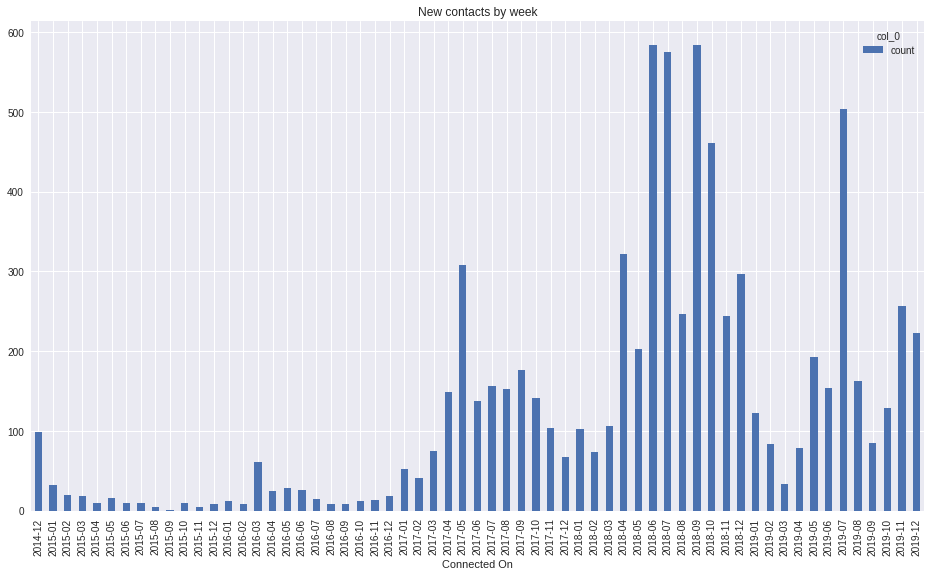

In [4]:
contact_date = pd.crosstab(index=dat["Connected On"].dt.to_period('m'),
                           columns="count")
contact_date.plot(kind="bar",figsize=(16,9), title="New contacts by week")#, cmap=clrs_7)

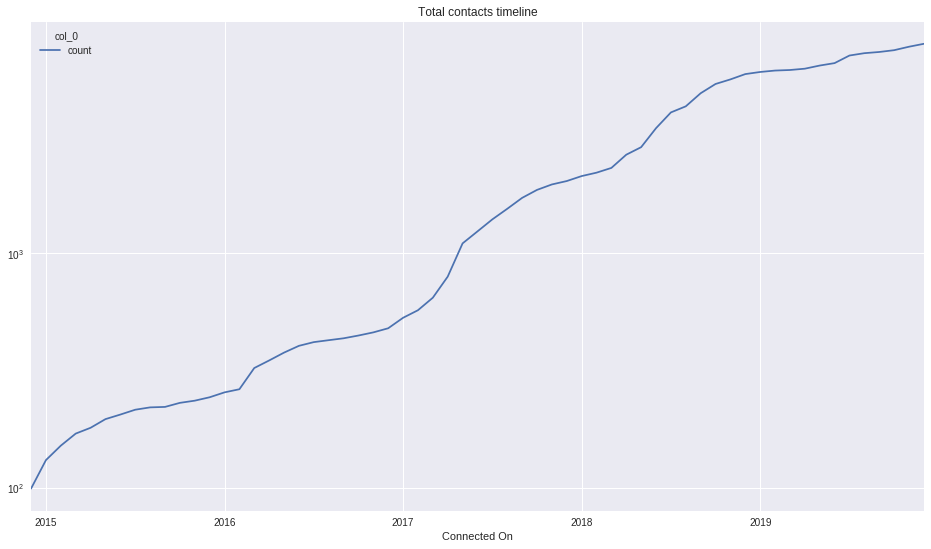

In [5]:
contact_date.cumsum().plot(figsize=(16,9),title="Total contacts timeline")#,cmap=clrs_7)
plt.yscale('log')

In [0]:
dat["Description"]=dat["Company"]+" "+dat["Position"]

In [7]:
### Non Company Description Accounts
print("Proportion of Non Company Description Accounts: ", sum(pd.isna(dat["Description"]))/len(pd.isna(dat["Description"])))
data=dat.dropna(subset=["Description"])#(how='any')
print("Filtered Contacts", len(pd.isna(data["Description"])))
#dat.iloc(pd.isna(dat["Description"]))
data.shape

Proportion of Non Company Description Accounts:  0.040198448034601195
Filtered Contacts 7545


(7545, 7)

In [0]:
stp_wrds=['de','en','del','la','las','sas','inc','in','of','the','el','los','ltda','com','ltd','and','llc',
     'para','san','sa','co','con','for','it','esp','eps','corp','at','av','sm','cia']

In [9]:
count_vect = CountVectorizer(stop_words=stp_wrds)#,ngram_range=(1,2))
n_grams_counts = count_vect.fit_transform(data["Description"])#.toarray()
n_grams_counts.shape
#count_vect.get_feature_names()

(7545, 8558)

In [10]:
#np.array([n_grams_counts.toarray().sum(axis=0),count_vect.get_feature_names()])
top_n = 300
txt_freqs= n_grams_counts.toarray().sum(axis=0)
indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
features =count_vect.get_feature_names()# vectorizer.get_feature_names()
# top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
print (top_features[:20])

[['data', 931], ['scientist', 515], ['analista', 489], ['colombia', 464], ['senior', 414], ['director', 406], ['manager', 377], ['universidad', 354], ['engineer', 313], ['gerente', 304], ['business', 248], ['analyst', 246], ['analytics', 230], ['profesional', 200], ['consultant', 200], ['jefe', 179], ['nacional', 178], ['learning', 178], ['selección', 176], ['software', 176]]


In [11]:
esp_words=[ 'universidad', 'nacional', 'banco', 'grupo', 'universitaria', 'fundación', 'seguros',
 'independiente', 'salud', 'corporación', 'centro', 'instituto', 'servicios', 'colegio',
 'consultores', 'pontificia', 'oficial', 'distrital', 'andina', 'educación', 'secretaria',
 'agencia', 'colombiana', 'católica', 'escuela', 'departamento',
 'humano', 'secretaría', 'soluciones', 'estadística',
 'organización', 'clínica', 'ministerio', 'seguridad', 'desarrollo', 'empresarial', 'fundacion', 'fundación',
 'integral', 'internacional', 'administrativo', 'casa', 'editorial', 'minuto',
 'talento', 'valle', 'universidade', 'consultoría', 'ingeniería', 'santo', 'gimnasio',
 'comercializadora', 'colombiano', 'servicio',
 'ejercito', 'investigación', 'tiempo', 'vida', 'alcaldia', 'fondo', 'bienestar',
 'inversiones', 'caja', 'consultoria', 'rosario', 'occidente', 'financiera', 'alianza', 'clinica',
 'asociados', 'nivel', 'bosque', 'corredores', 'tecnología',
 'psicología', 'generales', 'hogar', 'estudios', 'comercial',
 'compañía', 'latinoamericana', 'particular', 'empleo', 'comercio', 'professional',
 'digital', 'alcaldía', 'unidad', 'ventas', 'financieros', 'empresa', 'gestión', 'industria',
 'industriales', 'empresariales', 'pedagógica', 'república', 'norte', 'consultora',
 'mercantil', 'asociación', 'comunicaciones', 'asesorías',
 'consultor', 'terciarios', 'área', 'integración', 'artificial', 'cooperativa',
 'transportes','freelance','freelancer','consultant', 'datos',
          'analista','análisis','gerente','profesional','selección','seleccion','humanos',
          'psicólogo','psicóloga','psicologo','psicologa','directora',
          'estadístico','estadística','estadistico','analyst']

eng_words=['university', 'national', 'bank', 'group', 'university', 'foundation', 'insurance',
 'independent', 'health', 'corporation', 'center', 'institute', 'services', 'school',
 'consultancy', 'pontifical', 'official', 'district', 'andean', 'education', 'secretary',
 'agency', 'colombian', 'catholic', 'school', 'department',
 'human', 'secretary', 'solutions', 'statistics',
 'organization', 'clinic', 'ministry', 'security', 'development', 'business', 'foundation', 'foundation',
 'integral', 'international', 'administrative', 'house', 'editorial', 'minute',
 'talent', 'valley', 'university', 'consulting', 'engineering', 'saint', 'gym',
 'sales', 'colombian', 'servicio',
 'army', 'research', 'time', 'life', 'mayor', 'fund', 'wellness',
 'investments', 'box', 'consultancy', 'rosary', 'occident', 'financial', 'alliance', 'clinic',
 'associates', 'level', 'forest', 'broker', 'technology',
 'psychology', 'generals', 'home', 'studies', 'commercial',
 'company', 'latam', 'private', 'employment', 'commerce', 'professional',
 'digital', 'mayor', 'unit', 'sales', 'financial', 'company', 'management', 'industry',
 'industry', 'business', 'pedagogical', 'republic', 'north', 'consultancy',
 'mercantile', 'association', 'communications', 'consultancy',
 'consultancy', 'tertiary', 'area', 'integration', 'artificial', 'cooperative',
 'transport','consultancy','consultancy','consultancy','data',
          'analysis','analysis','manager','professional','selection','selection','human',
          'psychology','psychology','psychology','psychology','director',
          'statistics','statistics','statistics','analysis']
len(esp_words)==len(eng_words)

True

In [12]:
print("START lower case and unify most frequent words languaje")
for i in data.Description.index:
    jb_desc=str(data.Description[i]).lower()
    for n_wd in range (len (esp_words)):
        jb_desc = jb_desc.replace(esp_words[n_wd], eng_words[n_wd])
    data.Description[i]=jb_desc
#     print(i)
print("END")

START lower case and unify most frequent words languaje


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2882: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


END


In [13]:
# Repeat vectorization after replacement frequent terms
count_vect = CountVectorizer(stop_words=stp_wrds)#,ngram_range=(1,2))
n_grams_counts = count_vect.fit_transform(data["Description"])#.toarray()
n_grams_counts.shape
#count_vect.get_feature_names()

(7545, 8437)

In [14]:
top_n = 300
txt_freqs= n_grams_counts.toarray().sum(axis=0)
indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
features =count_vect.get_feature_names()# vectorizer.get_feature_names()
# top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
print (top_features[:25])

[['data', 1027], ['analysis', 775], ['manager', 681], ['consultancy', 609], ['university', 556], ['scientist', 515], ['director', 507], ['colombia', 464], ['senior', 414], ['psychology', 375], ['talent', 315], ['engineer', 313], ['group', 311], ['business', 289], ['development', 246], ['management', 241], ['research', 240], ['analytics', 230], ['professional', 229], ['selection', 213], ['human', 211], ['national', 198], ['bank', 189], ['jefe', 179], ['learning', 178]]


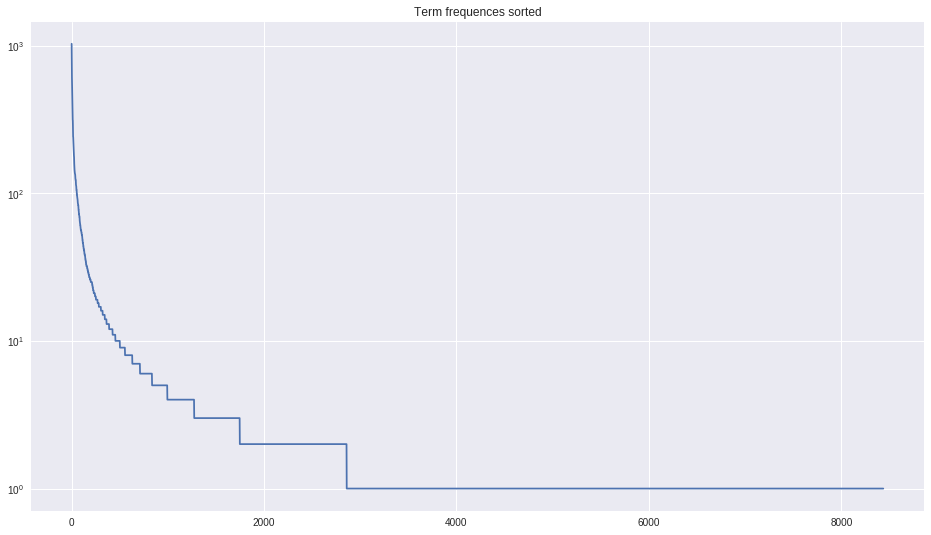

In [15]:
plt.figure(figsize=(16,9))
plt.plot(txt_freqs[indices])
plt.title("Term frequences sorted")
#txt_freqs[indices[:top_n]]
plt.yscale('log')

Text(0.5, 1.0, 'Terms count by profile')

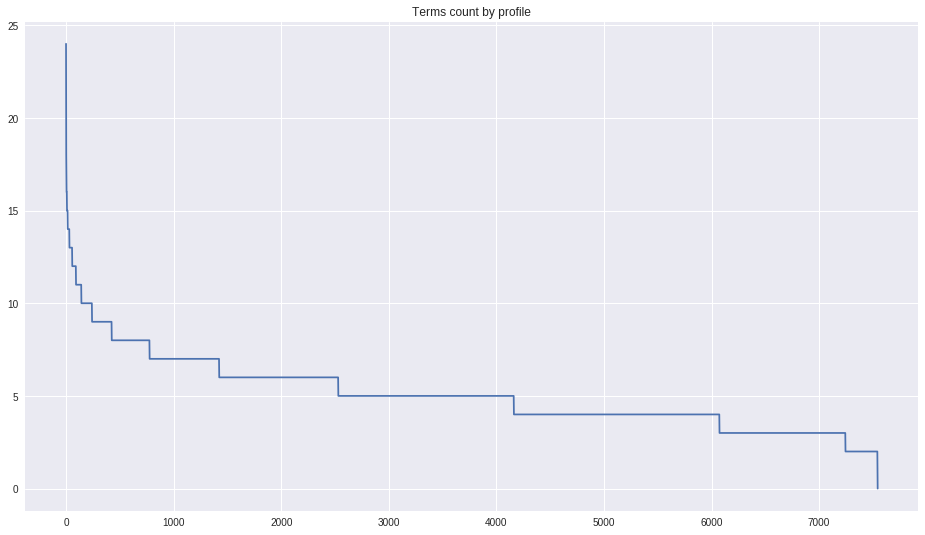

In [16]:
cntc_freqs= n_grams_counts.toarray().sum(axis=1)
cntc_indices = np.argsort(cntc_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
plt.figure(figsize=(16,9))
plt.plot(cntc_freqs[cntc_indices])
plt.title("Terms count by profile")
#txt_freqs[indices[:top_n]]
# plt.yscale('log')

col_0  count
row_0       
0          2
1          1
2        298
3       1171
4       1911
5       1632
6       1107
7        647
8        352
9        183
10        99
11        50
12        35
13        26
14        16
15         7
16         3
17         2
18         1
20         1
24         1


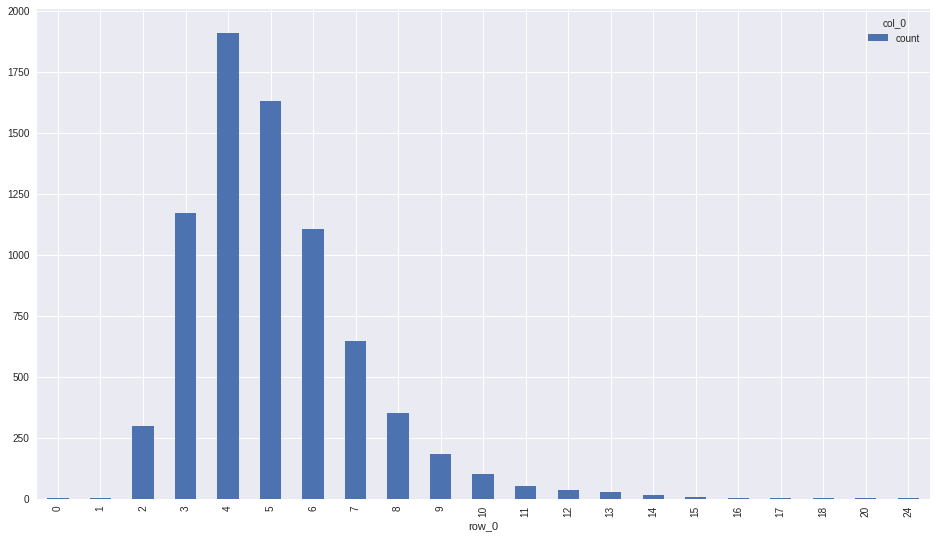

In [17]:
print(pd.crosstab(index=cntc_freqs, columns="count"))
pd.crosstab(index=cntc_freqs, columns="count").plot(kind="bar",figsize=(16,9))#/3409
#(cntc_freqs)

In [18]:
tfidf_transformer = TfidfVectorizer(stop_words=stp_wrds)
n_grams_tfidf = tfidf_transformer.fit_transform(data["Description"])
n_grams_tfidf.shape

(7545, 8437)

Text(0.5, 1.05, 'Term-frequence matrix')

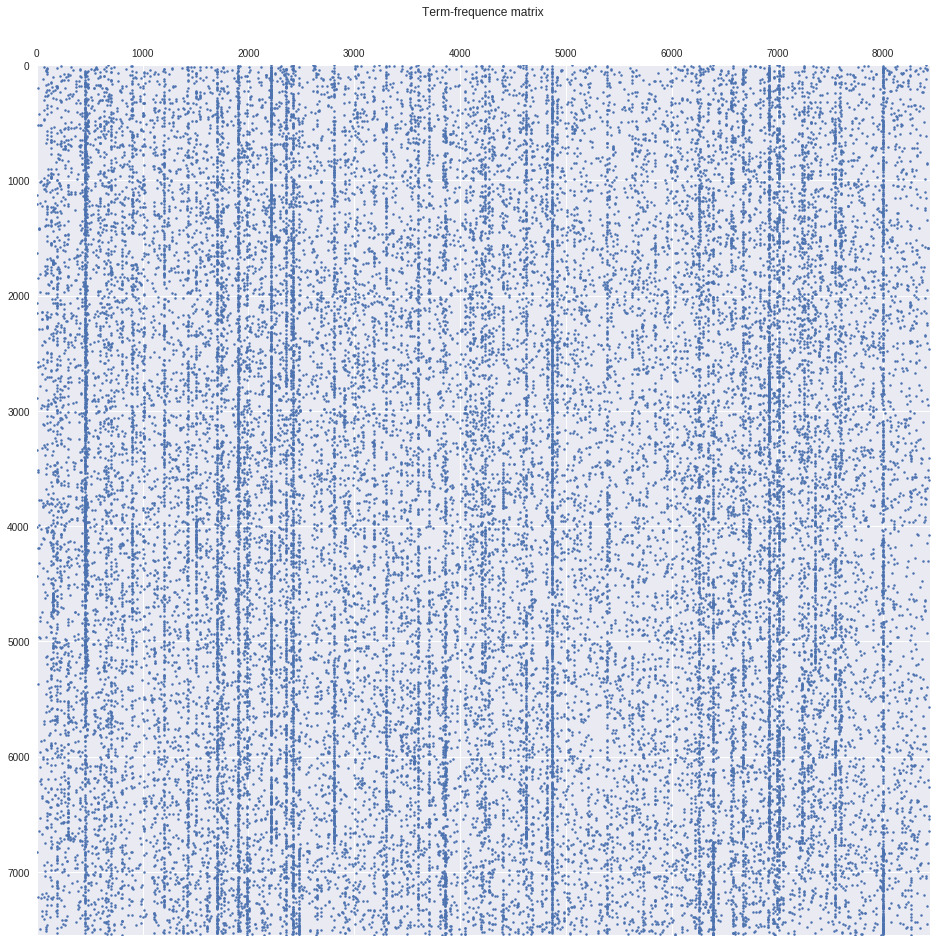

In [19]:
plt.figure(figsize=(16,16))
plt.spy(n_grams_counts,markersize=2.5, marker="o",aspect='auto')
plt.title("Term-frequence matrix")

Text(0.5, 1.05, 'tf-idf matrix')

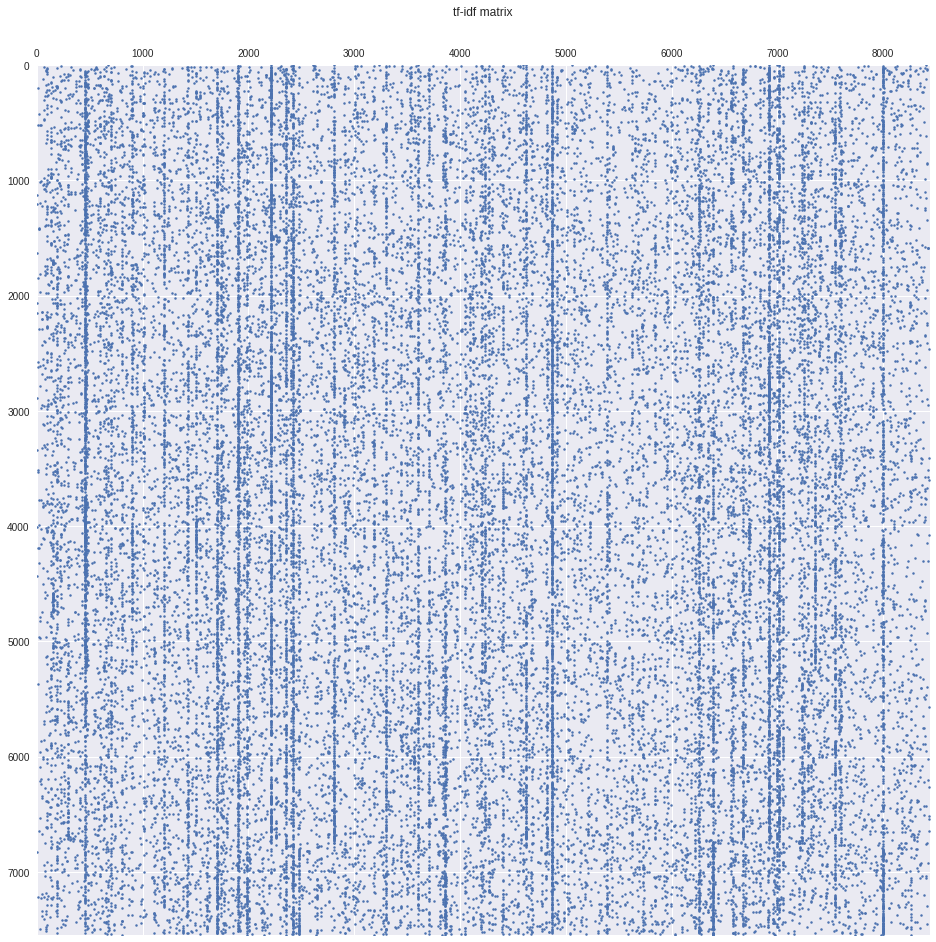

In [20]:
plt.figure(figsize=(16,16))
plt.spy(n_grams_tfidf,markersize=2.5, marker="o",aspect='auto')#,markersize=3
plt.title("tf-idf matrix")

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


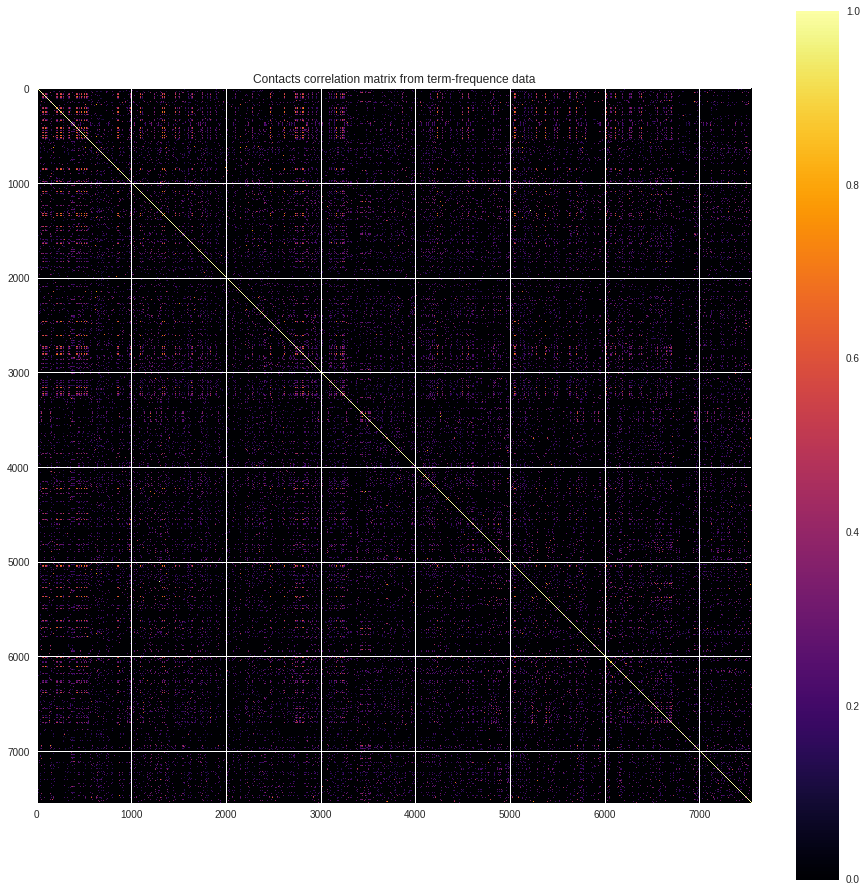

In [21]:
plt.figure(figsize=(16,16))
plt.imshow(np.corrcoef(n_grams_counts.toarray()), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from term-frequence data")
plt.colorbar()
plt.show()

In [0]:
dist_mat_full=pairwise_distances(n_grams_counts.toarray())

In [0]:
dist_vec_full=dist_mat_full.flatten()#/n_grams_tfidf_dist_mat.shape[0]**2

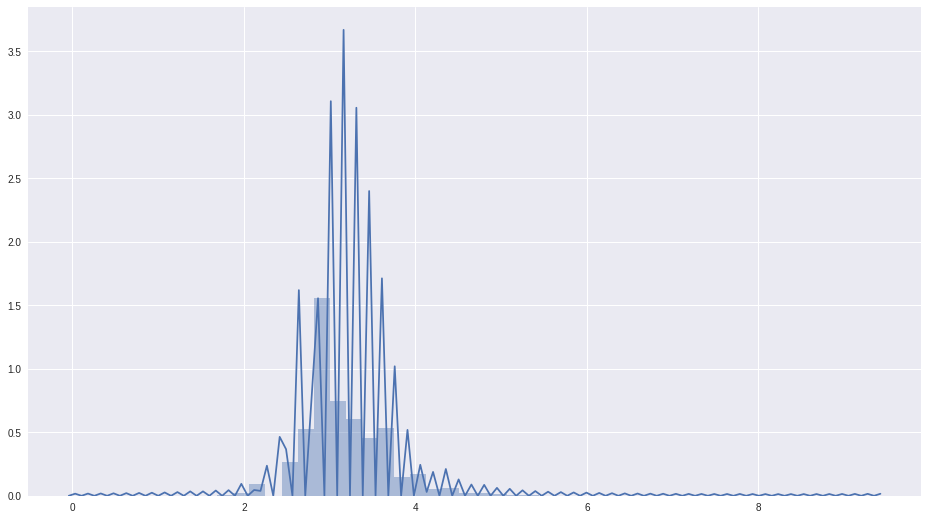

In [24]:
plt.figure(figsize=(16,9))
sns.distplot(dist_vec_full)

In [0]:
freq_dists_full=pd.crosstab(index=np.round_(dist_vec_full,3), columns="count")
# freq_dists_full=pd.Series(freq_dists_full,freq_dists_full.index)

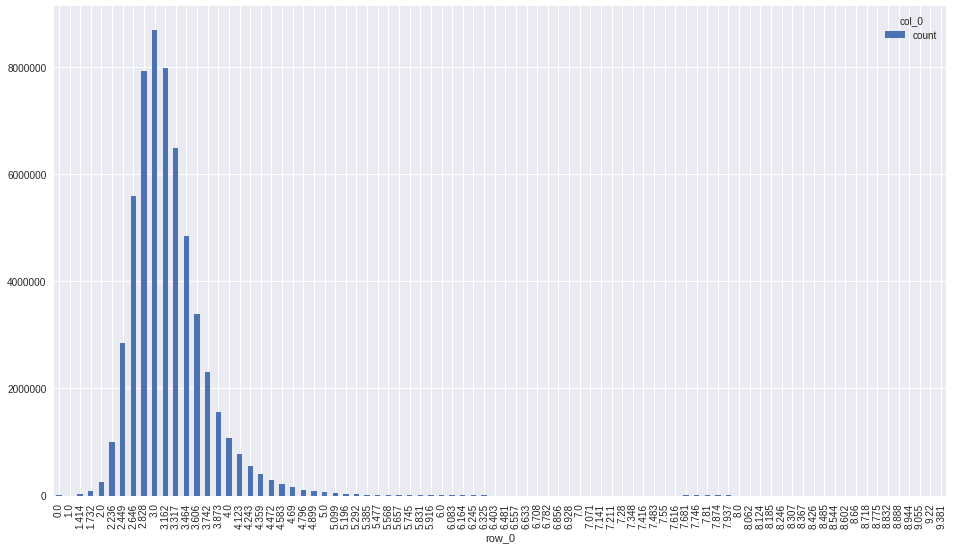

In [26]:
# print(freq_dists_full.iloc[:150,:])#.iloc[:50,:])
freq_dists_full.plot(kind="bar",figsize=(16,9))#.iloc[:150,:]

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


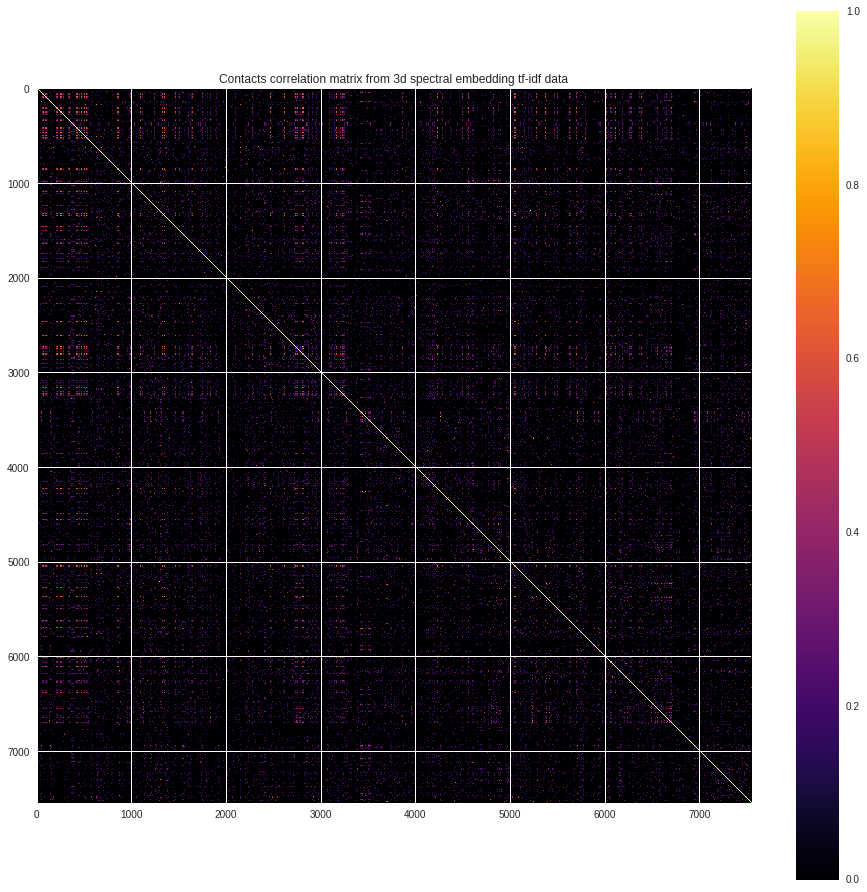

In [27]:
plt.figure(figsize=(16,16))
# plt.imshow(np.corrcoef(spect_emb_tfidf_12d), cmap=plt.cm.inferno, interpolation='nearest')
plt.imshow(np.corrcoef(n_grams_counts.toarray()), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from 3d spectral embedding tf-idf data")
plt.colorbar()
plt.show()

In [0]:
contacts_ward_full=hierarchy.linkage(n_grams_counts.toarray(), 'ward')

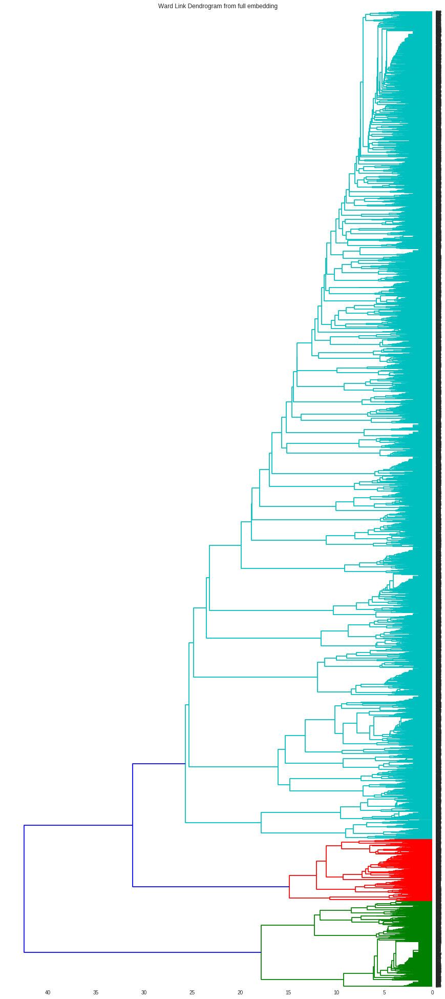

In [29]:
plt.figure(figsize=(15,35))
dn_tf_full = hierarchy.dendrogram(contacts_ward_full,orientation="left")
plt.title('Ward Link Dendrogram from full embedding')
plt.show()

In [0]:
n_grams_count_300=n_grams_counts.toarray()[:,indices[:top_n]]

Text(0.5, 1.05, 'Top 300 frequency term frequency matrix')

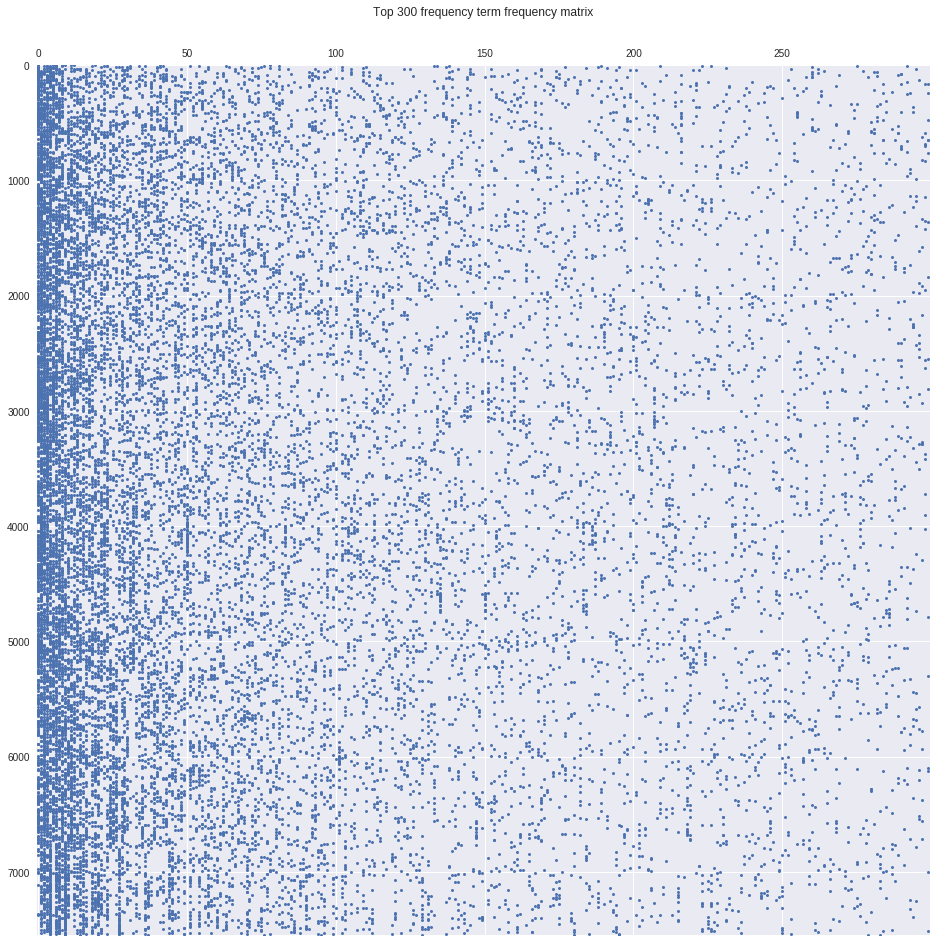

In [31]:
plt.figure(figsize=(16,16))
plt.spy(n_grams_count_300,markersize=3,aspect='auto', marker="o")
plt.title("Top 300 frequency term frequency matrix")

277

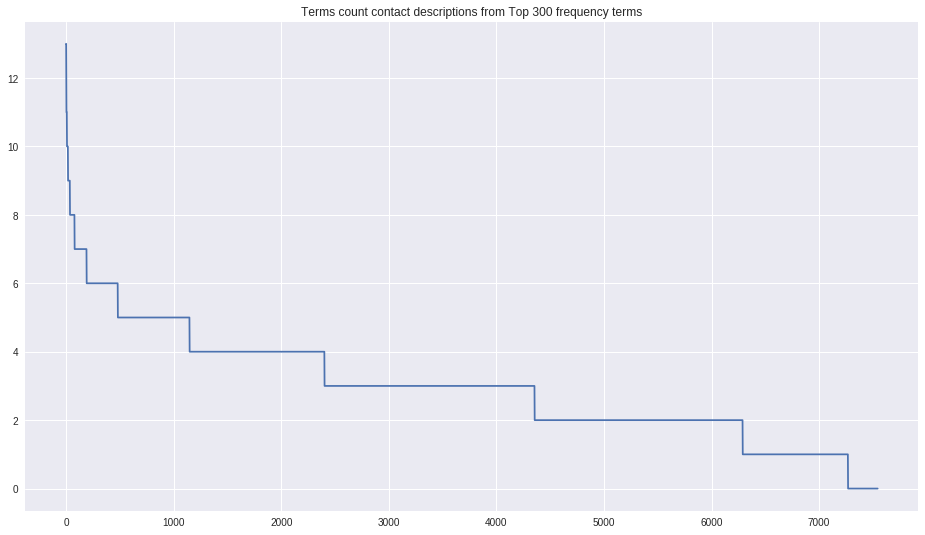

In [32]:
cntc_freqs_300=n_grams_count_300.sum(axis=1)
cntc_indices_300 = np.argsort(cntc_freqs_300)[::-1]#np.argsort(vectorizer.idf_)[::-1]
plt.figure(figsize=(16,9))
plt.plot(cntc_freqs_300[cntc_indices_300])
plt.title("Terms count contact descriptions from Top 300 frequency terms")
sum(cntc_freqs_300<1)

In [0]:
dist_mat_300=pairwise_distances(n_grams_count_300)

In [0]:
dist_vec_300=dist_mat_300.flatten()#/n_grams_tfidf_dist_mat.shape[0]**2

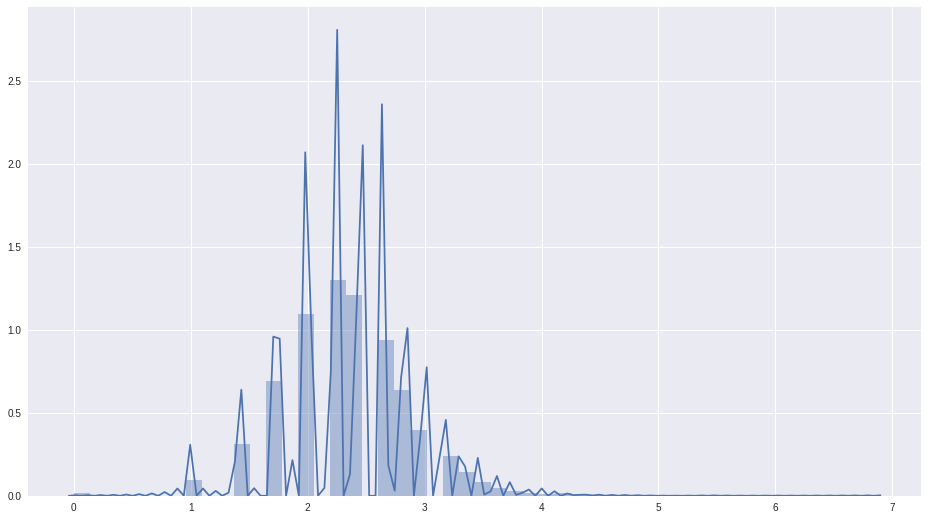

In [35]:
plt.figure(figsize=(16,9))
sns.distplot(dist_vec_300)

In [0]:
freq_dists_300=pd.crosstab(index=np.round_(dist_vec_300,3), columns="count")

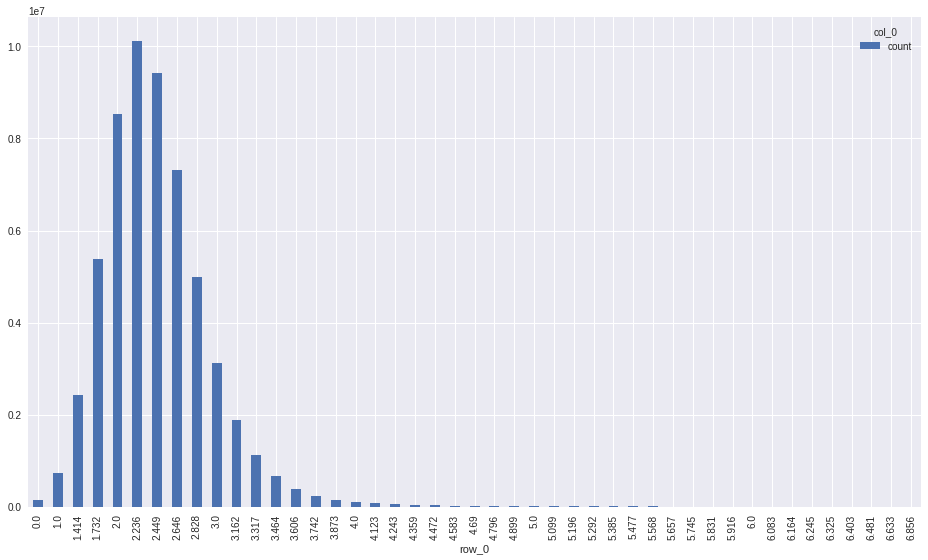

In [37]:
# print(freq_dists_full.iloc[:150,:])#.iloc[:50,:])
freq_dists_300.iloc[:150,:].plot(kind="bar",figsize=(16,9))#.iloc[:150,:]

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


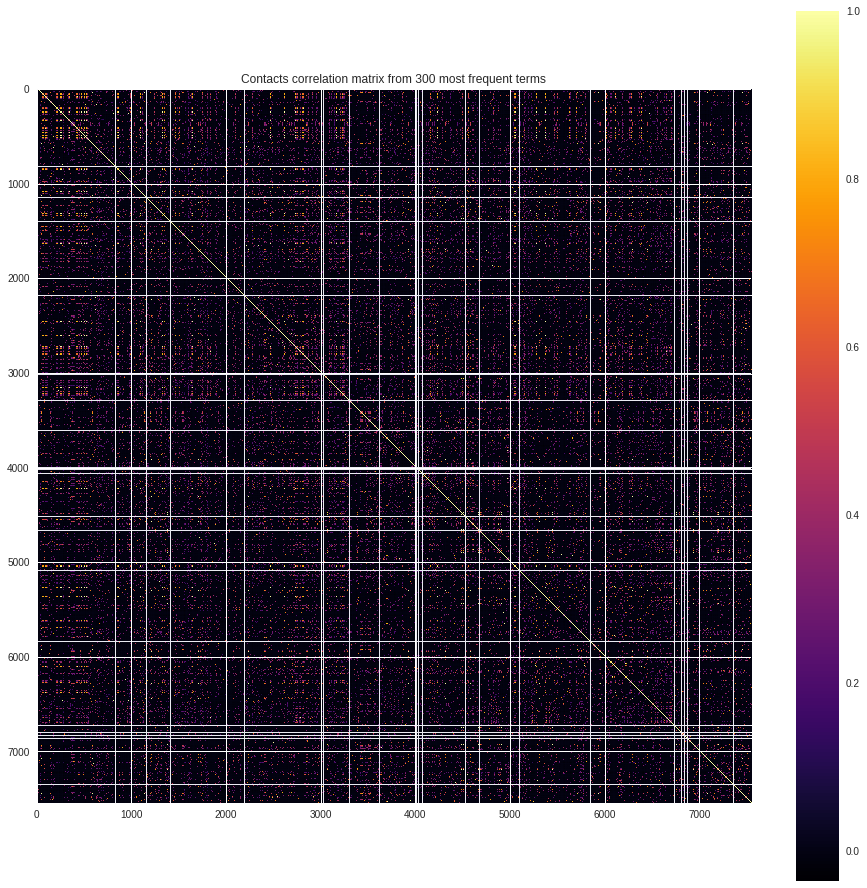

In [38]:
plt.figure(figsize=(16,16))
# plt.imshow(np.corrcoef(spect_emb_tfidf_12d), cmap=plt.cm.inferno, interpolation='nearest')
plt.imshow(np.corrcoef(n_grams_count_300), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from 300 most frequent terms")
plt.colorbar()
plt.show()

In [0]:
contacts_ward_300=hierarchy.linkage(n_grams_count_300, 'ward')

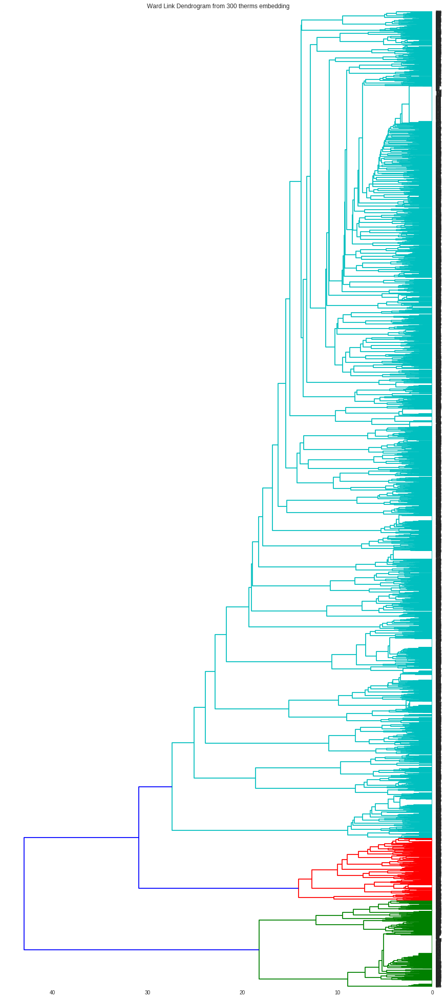

In [40]:
plt.figure(figsize=(15,35))
dn_tf_300 = hierarchy.dendrogram(contacts_ward_300,orientation="left")
plt.title('Ward Link Dendrogram from 300 therms embedding')
plt.show()


## 3 dimentions spectral embedding Ward and DB-scan culstering

In [0]:
# 3d Embedding for visualization
spect_emb_tfidf_3=manifold.SpectralEmbedding(n_components=3, n_jobs=-1).fit_transform(n_grams_counts.toarray())

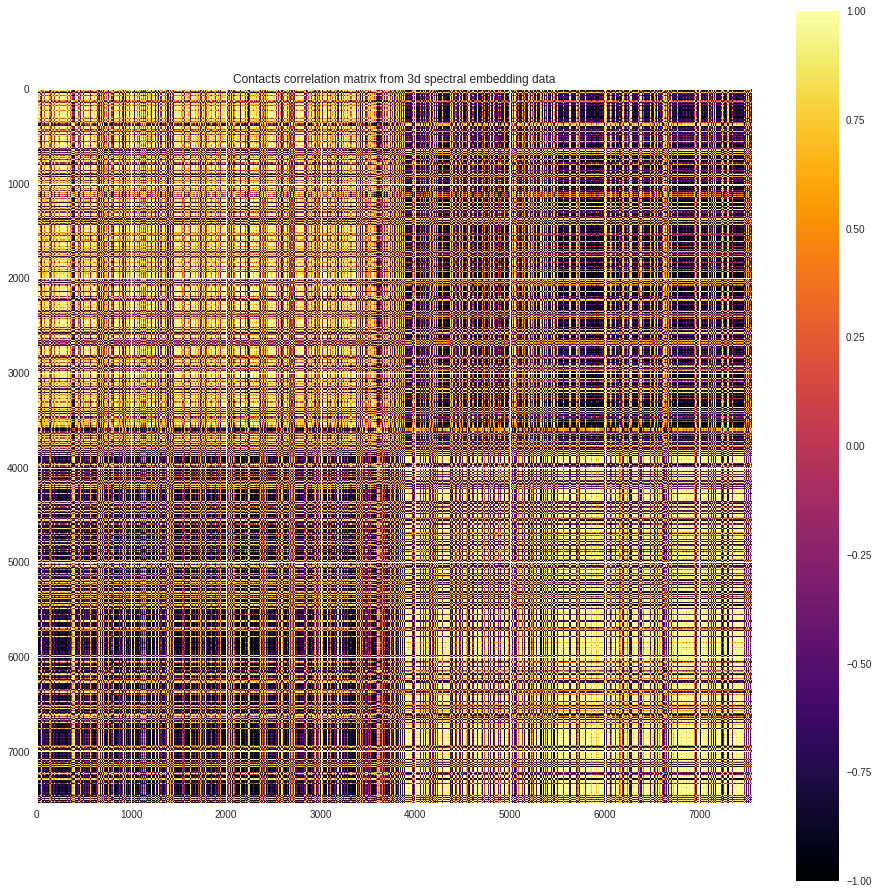

In [42]:
plt.figure(figsize=(16,16))
# plt.imshow(np.corrcoef(spect_emb_tfidf_12d), cmap=plt.cm.inferno, interpolation='nearest')
plt.imshow(np.corrcoef(spect_emb_tfidf_3), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from 3d spectral embedding data")
plt.colorbar()
plt.show()

In [0]:
# contacts_ward_12d=hierarchy.linkage(spect_emb_tfidf_12d, 'ward')
contacts_ward_12d=hierarchy.linkage(spect_emb_tfidf_3, 'ward')

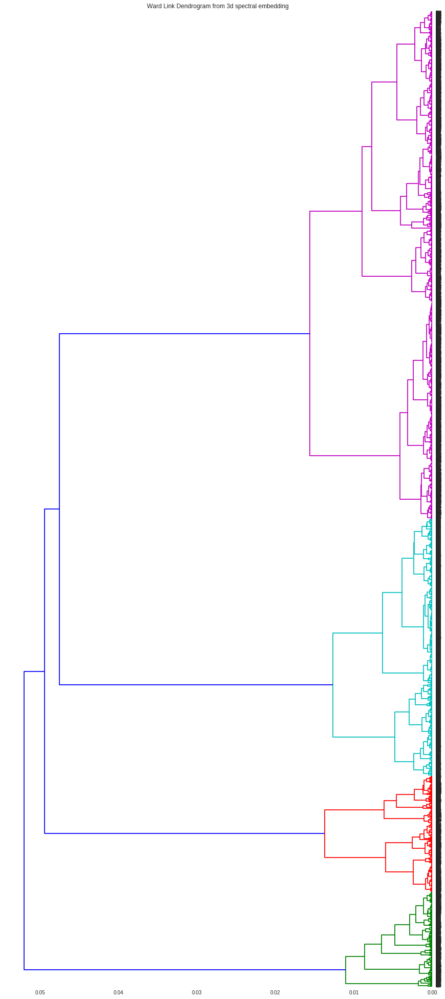

In [44]:
plt.figure(figsize=(15,35))
dn_tf = hierarchy.dendrogram(contacts_ward_12d,orientation="left")
plt.title('Ward Link Dendrogram from 3d spectral embedding')
plt.show()

In [0]:
connectivity = kneighbors_graph(spect_emb_tfidf_3, n_neighbors=15, include_self=False)

In [46]:
clustering_12d_ward = AgglomerativeClustering(linkage='ward', n_clusters=7,connectivity=connectivity)
# clustering_12d_ward.fit(spect_emb_tfidf_12d)
clustering_12d_ward.fit(spect_emb_tfidf_3)
# clustering.fit(n_grams_tfidf.toarray())

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=<7545x7545 sparse matrix of type '<class 'numpy.float64'>'
	with 113175 stored elements in Compressed Sparse Row format>,
                        distance_threshold=None, linkage='ward', memory=None,
                        n_clusters=7, pooling_func='deprecated')

In [47]:
pd.crosstab(index=clustering_12d_ward.labels_, columns="count")

col_0,count
row_0,
0,1990
1,649
2,2243
3,367
4,1681
5,86
6,529


In [0]:
# def plot_dendrogram(model, **kwargs):
#     # Create linkage matrix and then plot the dendrogram

#     # create the counts of samples under each node
#     counts = np.zeros(model.children_.shape[0])
#     n_samples = len(model.labels_)
#     for i, merge in enumerate(model.children_):
#         current_count = 0
#         for child_idx in merge:
#             if child_idx < n_samples:
#                 current_count += 1  # leaf node
#             else:
#                 current_count += counts[child_idx - n_samples]
#         counts[i] = current_count

#     linkage_matrix = np.column_stack([model.children_, model.distances_,
#                                       counts]).astype(float)

#     # Plot the corresponding dendrogram
#     dendrogram(linkage_matrix, **kwargs)

In [0]:
# plt.figure(figsize=(15,35))
# plt.title('Hierarchical Clustering Dendrogram')
# # plot the top three levels of the dendrogram
# plot_dendrogram(clustering_12d_ward, truncate_mode='level', p=3, orientation="left")
# plt.xlabel("Number of points in node (or index of point if no parenthesis).")
# plt.show()

In [0]:
# clustering_colors=matplotlib.colors.LinearSegmentedColormap.from_list("", ['#d9d9d9','#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#a65628'])#

In [0]:
spect_emb_tfidf_3=spect_emb_tfidf_3*1000

Text(0.5, 1.0, '2d spectral coordinates from 12d spectral hierarchical (ward) clustering')

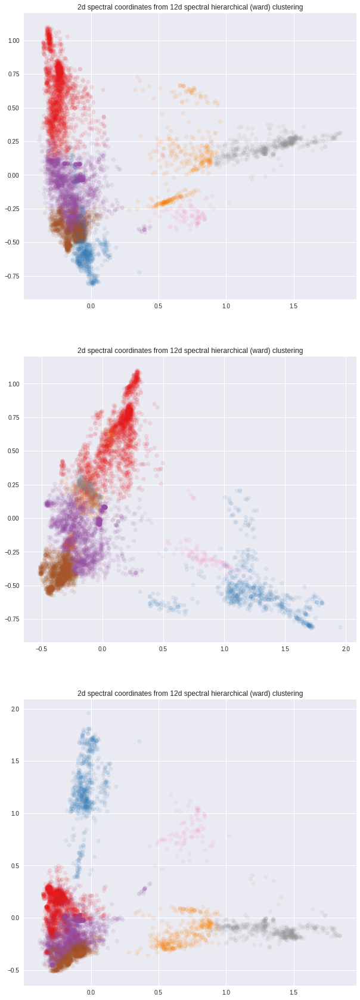

In [52]:
plt.figure(figsize=(10,30))
par_alf=0.1
plt.subplot(311)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,1], alpha=par_alf,s=45, c=clustering_12d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 12d spectral hierarchical (ward) clustering")

plt.subplot(312)
plt.scatter(spect_emb_tfidf_3[:,2],spect_emb_tfidf_3[:,1], alpha=par_alf,s=45, c=clustering_12d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 12d spectral hierarchical (ward) clustering")

plt.subplot(313)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,2], alpha=par_alf,s=45, c=clustering_12d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 12d spectral hierarchical (ward) clustering")

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Making animation


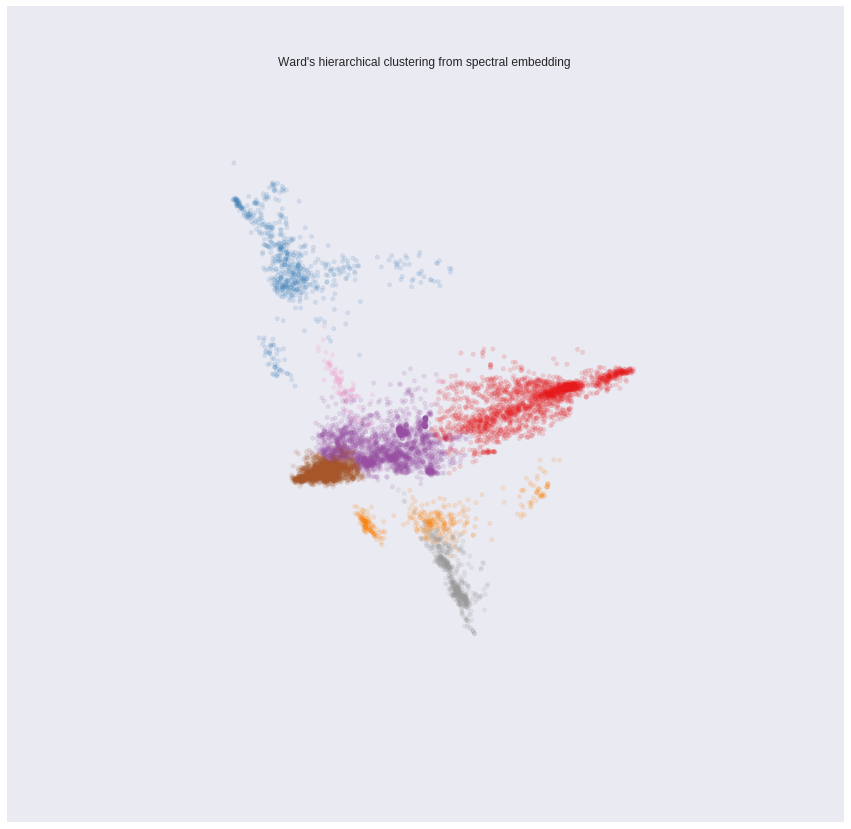

In [53]:
 fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=spect_emb_tfidf_3[:,0],
           ys=spect_emb_tfidf_3[:,1],
           zs=spect_emb_tfidf_3[:,2],
           c=clustering_12d_ward.labels_, 
           alpha=0.15,
           cmap=plt.cm.Set1)
plt.title("Ward's hierarchical clustering from spectral embedding ")
plt.axis('off') # remove axes for visual appeal

def rotate(angle):
    ax.view_init(azim=angle)
print("Making animation")
rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 362, 2), interval=100)
rot_animation.save(files_route+'ward_clusters.gif', dpi=80, writer='imagemagick')

In [0]:
# dist_mat_12d=pairwise_distances(spect_emb_tfidf_12d)
dist_mat_12d=pairwise_distances(spect_emb_tfidf_3)

In [0]:
dist_vec=dist_mat_12d.flatten()#/n_grams_tfidf_dist_mat.shape[0]**2

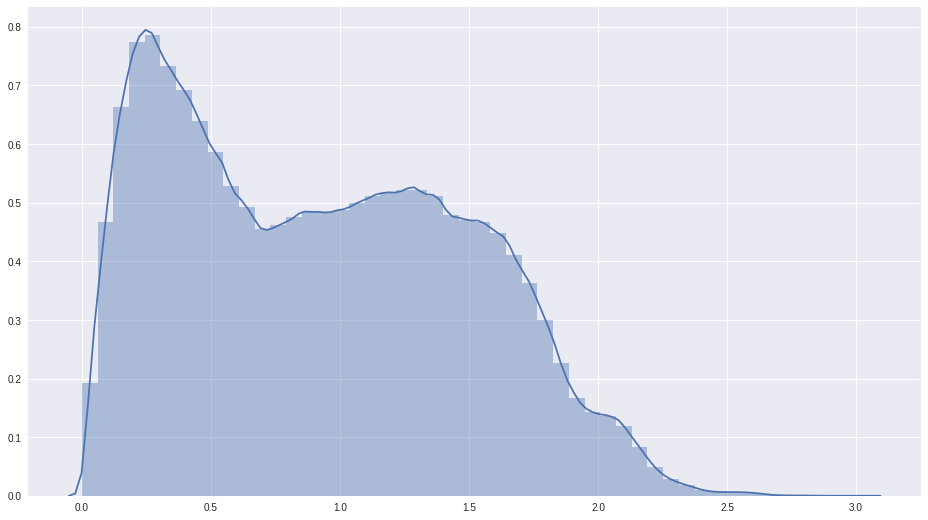

In [56]:
plt.figure(figsize=(16,9))
# plt.hist(n_grams_tfidf_dist_mat.flatten())
sns.distplot(dist_vec)
# sns.kdeplot()

col_0  count
row_0       
0.000   7575
0.001    104
0.002    274
0.003    492
0.004    754
...      ...
0.145  36596
0.146  36816
0.147  37138
0.148  37428
0.149  37202

[150 rows x 1 columns]


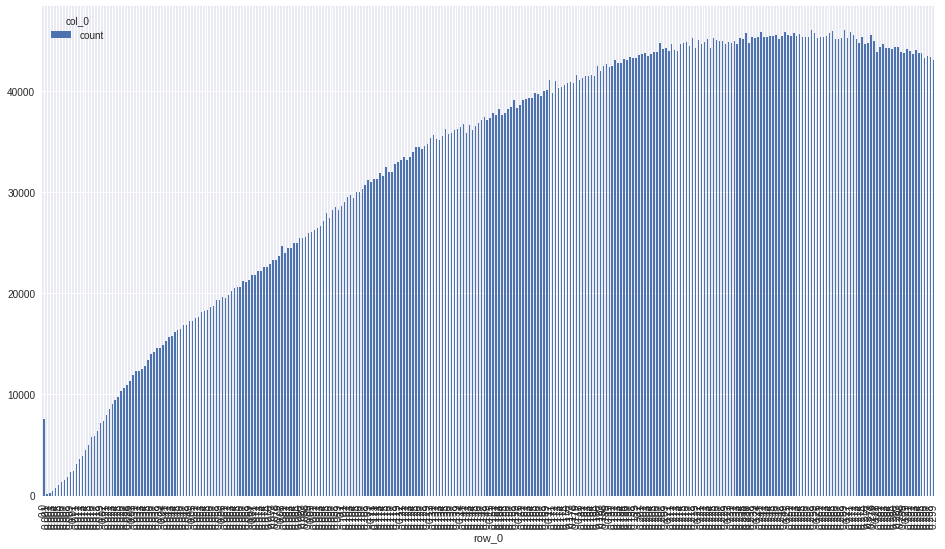

In [57]:
freq_dists=pd.crosstab(index=np.round_(dist_vec,3), columns="count")
print(freq_dists.iloc[:150,:])#.iloc[:50,:])
freq_dists.iloc[:300,:].plot(kind="bar",figsize=(16,9))#.iloc[:150,:]

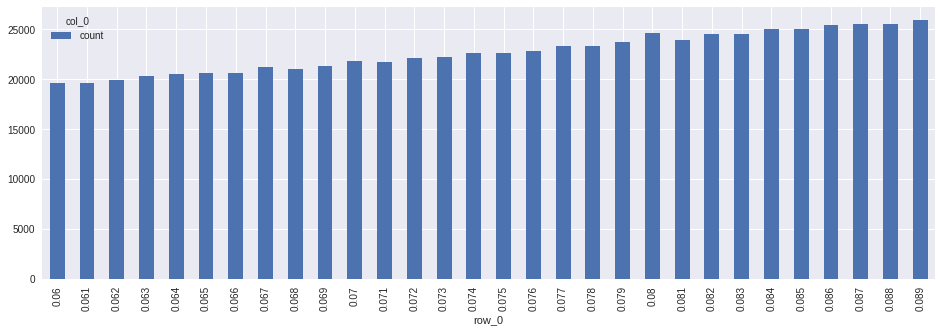

In [106]:
freq_dists.iloc[60:90,:].plot(kind="bar",figsize=(16,5))#.iloc[:150,:]

col_0,count
row_0,
-1,2465
0,3138
1,363
2,1356
3,223


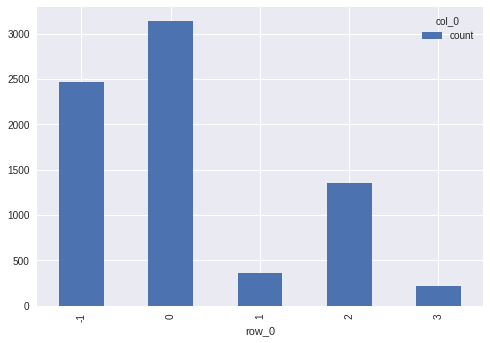

In [135]:
# db_scan = DBSCAN(eps=.99, min_samples=3).fit(n_grams_tfidf.toarray())
# db_scan = DBSCAN(eps=.18, min_samples=70).fit(spect_emb_tfidf_12d)#spect_emb_tfidf)
db_scan = DBSCAN(eps=.1, min_samples=150).fit(spect_emb_tfidf_3)#spect_emb_tfidf)
spect_db_labels = db_scan.labels_
pd.crosstab(index=spect_db_labels, columns="count").plot(kind="bar")
pd.crosstab(index=spect_db_labels, columns="count")

In [0]:
clustering_colors=matplotlib.colors.LinearSegmentedColormap.from_list("", ['#d9d9d9','#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#a65628'])#

array([-1,  0, -1, ...,  0,  1,  0])

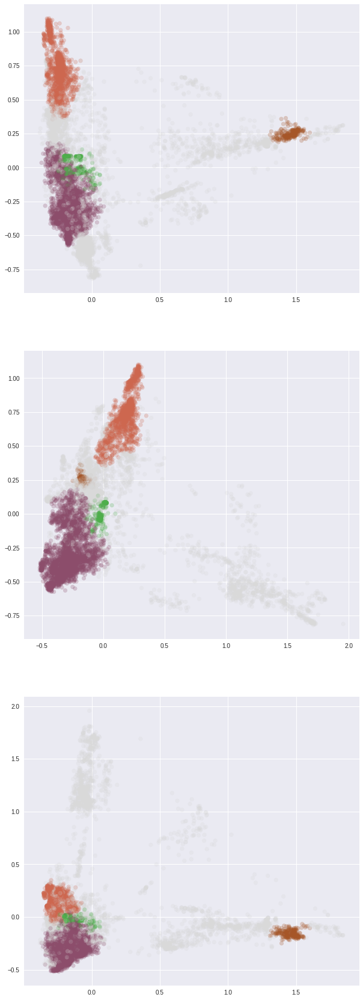

In [142]:
plt.figure(figsize=(10,30))
par_alf=0.15

plt.subplot(311)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,1], alpha=0.25,s=45, c=spect_db_labels, cmap=clustering_colors)#plt.cm.tab10)

plt.subplot(312)
plt.scatter(spect_emb_tfidf_3[:,2],spect_emb_tfidf_3[:,1], alpha=0.25,s=45, c=spect_db_labels, cmap=clustering_colors)#plt.cm.tab10)plt.title("2d spectral coordinates from 12d spectral hierarchical (ward) clustering")

plt.subplot(313)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,2], alpha=0.25,s=45, c=spect_db_labels, cmap=clustering_colors)#plt.cm.tab10)

spect_db_labels

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Making animation


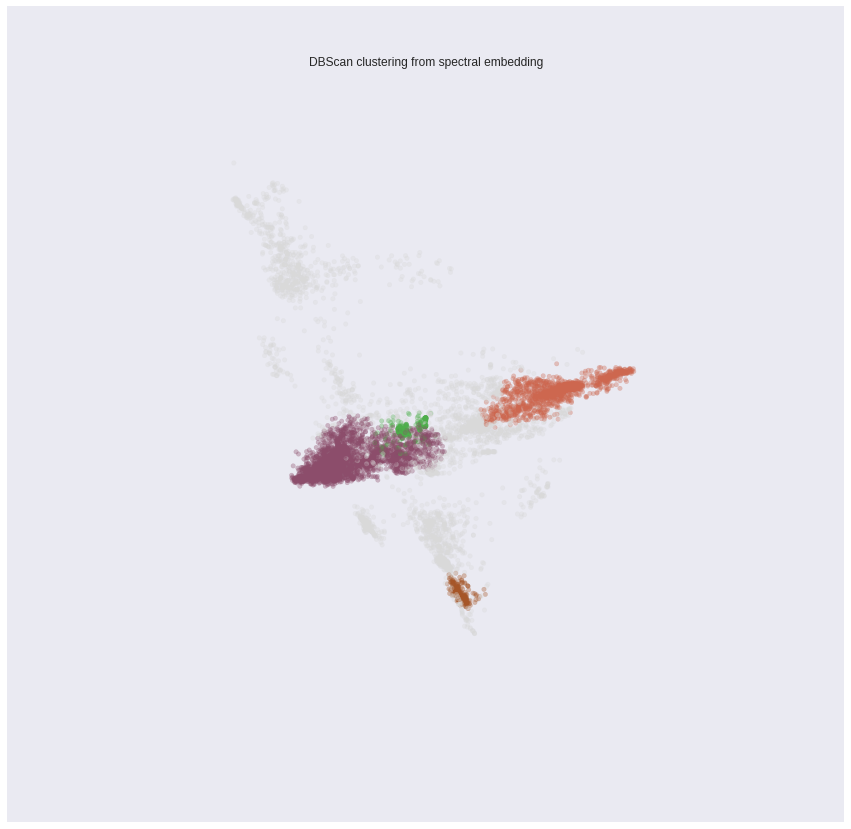

In [143]:
# https://stackoverflow.com/questions/51457738/animating-a-3d-scatterplot-with-matplotlib-to-gif-ends-up-empty
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=spect_emb_tfidf_3[:,0],
           ys=spect_emb_tfidf_3[:,1],
           zs=spect_emb_tfidf_3[:,2],
           c=spect_db_labels, 
           alpha=0.35,
           cmap=clustering_colors)
plt.title("DBScan clustering from spectral embedding")
plt.axis('off') # remove axes for visual appeal

def rotate(angle):
    ax.view_init(azim=angle)

print("Making animation")
rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 362, 2), interval=100)
rot_animation.save(files_route+'DB_clustering.gif', dpi=80, writer='imagemagick')

# Word Cloud

In [0]:
fr_dic={ str(features[i]).upper():txt_freqs[i] for i in indices[:top_n]}
clrs_wrdcld=matplotlib.colors.LinearSegmentedColormap.from_list("", [#'#a50026',
                                                                     '#d73027',
                                                                     '#f46d43',
                                                                     '#fdae61',
#                                                                      '#fee090',
#                                                                      '#ffffbf',
#                                                                      '#e0f3f8',
#                                                                      '#abd9e9',
                                                                     '#74add1',
                                                                     '#4575b4',
                                                                     '#313695'])

In [145]:
pic_wide=900
wc = WordCloud(width=pic_wide,  height=int(pic_wide*(9/21)), 
               background_color=None, mode="RGBA",min_font_size=8,
               colormap=clrs_wrdcld)#plt.cm.Set1_r) #tab10_r)Dark2_r,Paired_r
wc.generate_from_frequencies(fr_dic)

(-0.5, 899.5, 384.5, -0.5)

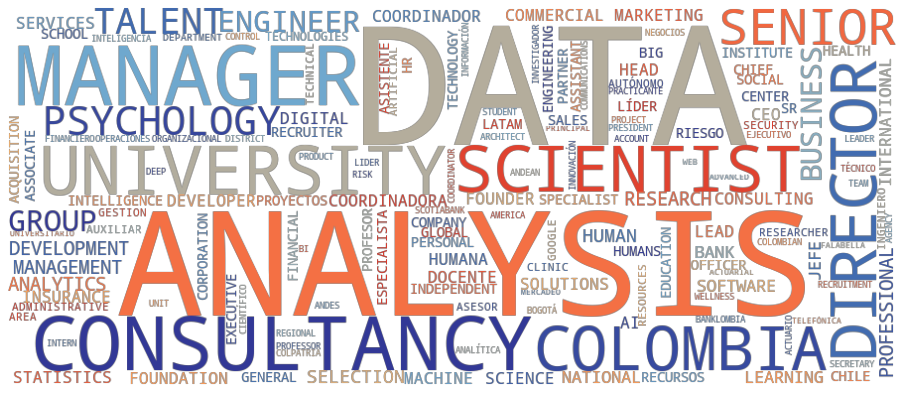

In [146]:
plt.figure(figsize=(16,9))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
# plt.savefig('wrdcld.png')

In [147]:
pd.crosstab(index=clustering_12d_ward.labels_, columns=spect_db_labels)

col_0,-1,0,1,2,3
row_0,,,,,
0,629,5,0,1356,0
1,649,0,0,0,0
2,425,1455,363,0,0
3,367,0,0,0,0
4,3,1678,0,0,0
5,86,0,0,0,0
6,306,0,0,0,223


## Wordcloud by clusters

In [0]:
def wrd_cld_dic_clust(clust_labels,clust_id,top_n=300):
    txt_freqs= n_grams_counts.toarray()[clust_labels==clust_id].sum(axis=0)
    indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
    features =count_vect.get_feature_names()# vectorizer.get_feature_names()
    # top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
    top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
    fr_dic={ str(features[i]).upper():txt_freqs[i] for i in indices[:top_n]}
    wc = WordCloud(width=pic_wide,  height=int(pic_wide*(9/21)), 
               background_color=None, mode="RGBA",min_font_size=8,
               colormap=clrs_wrdcld)#plt.cm.Set1_r) #tab10_r)Dark2_r,Paired_r
    wc.generate_from_frequencies(fr_dic)
    return wc


### Wordcloud Ward

(-0.5, 899.5, 384.5, -0.5)

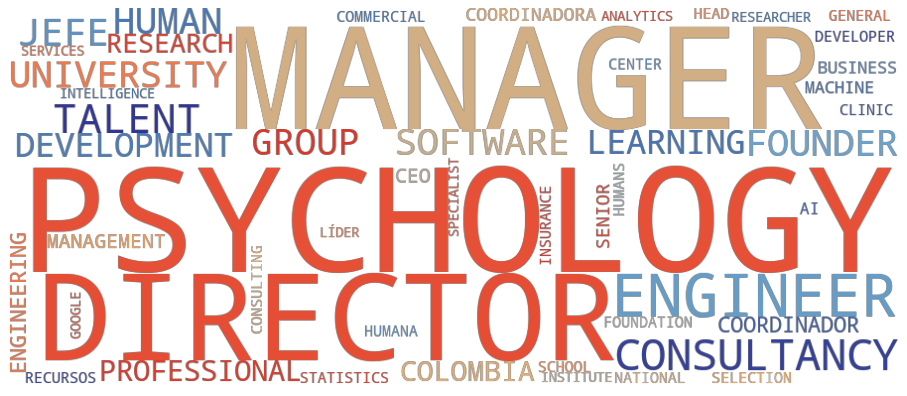

In [149]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_12d_ward.labels_,0,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

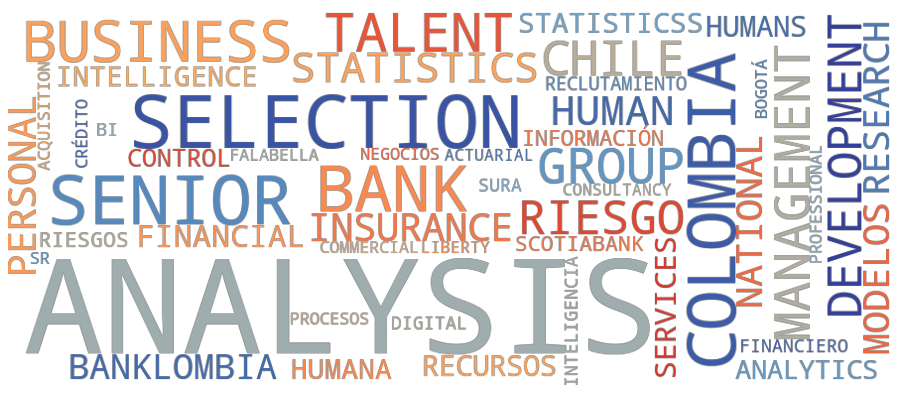

In [151]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_12d_ward.labels_,1,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

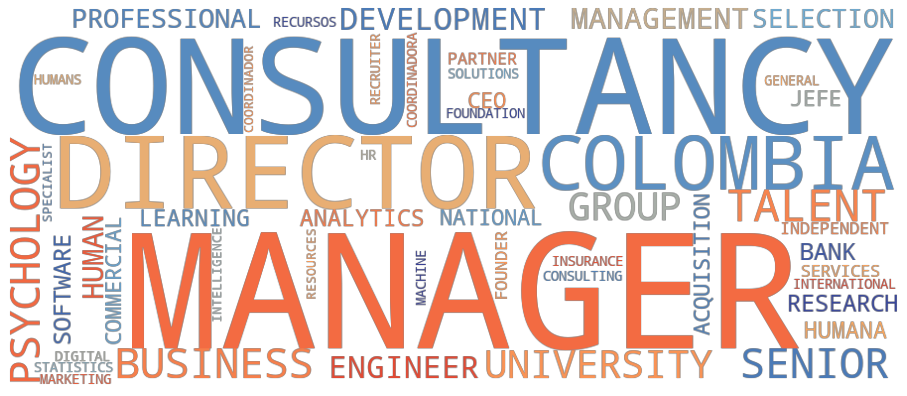

In [152]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_12d_ward.labels_,2,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

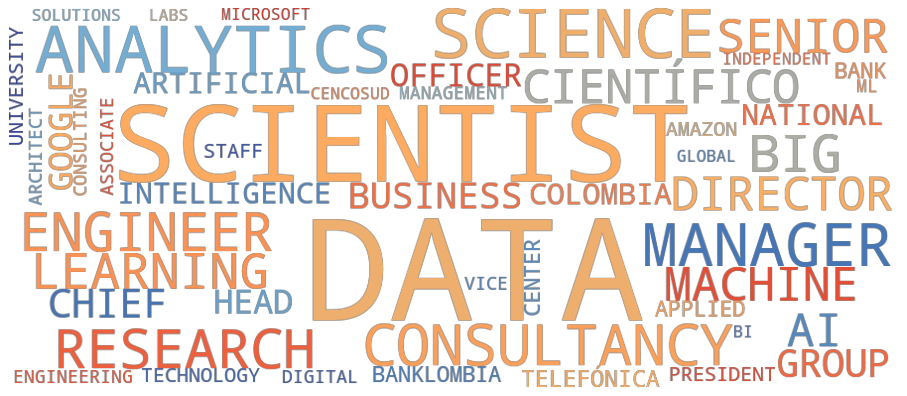

In [153]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_12d_ward.labels_,3,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

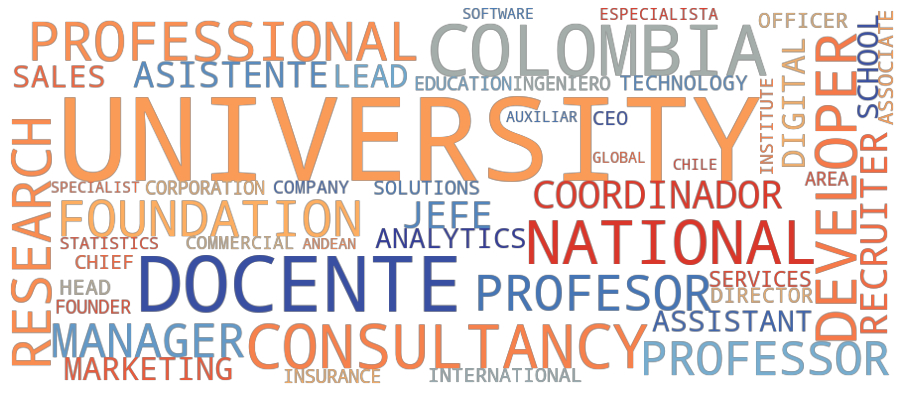

In [154]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_12d_ward.labels_,4,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

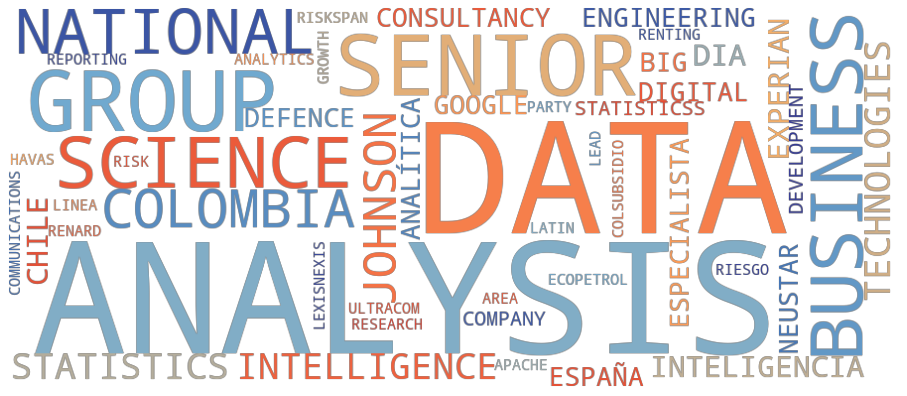

In [155]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_12d_ward.labels_,5,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

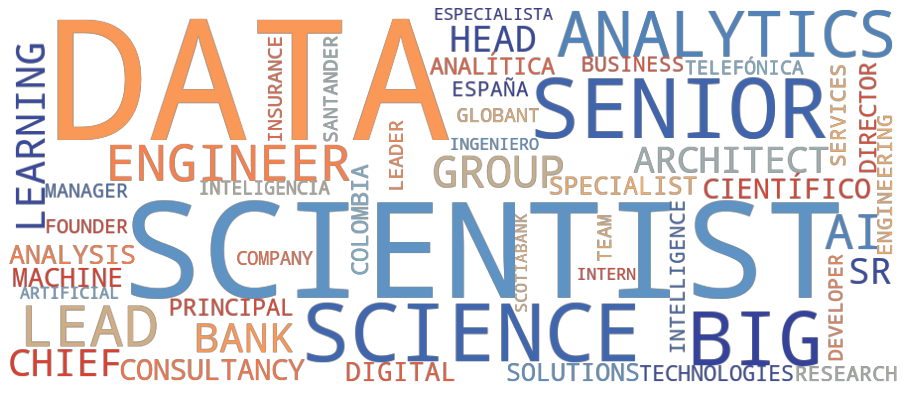

In [156]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_12d_ward.labels_,6,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

## wordcloud DBScan

(-0.5, 899.5, 384.5, -0.5)

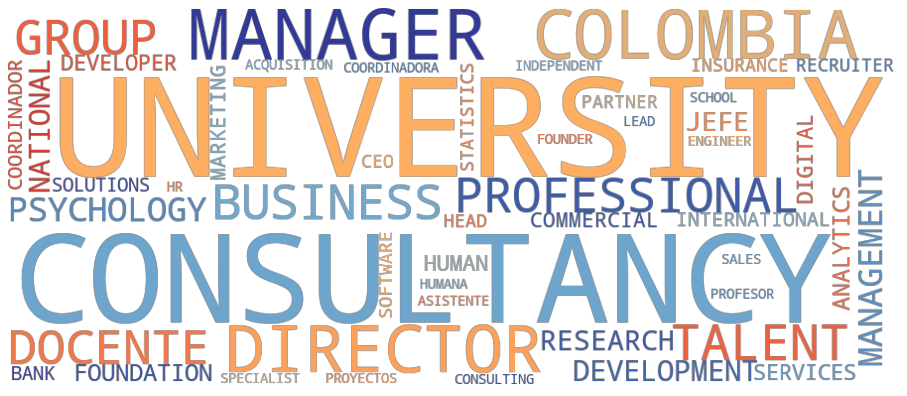

In [158]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,0,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

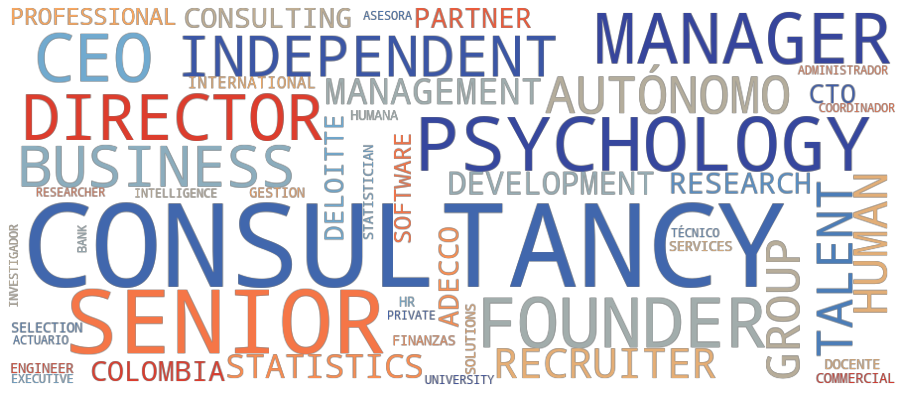

In [159]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,1,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

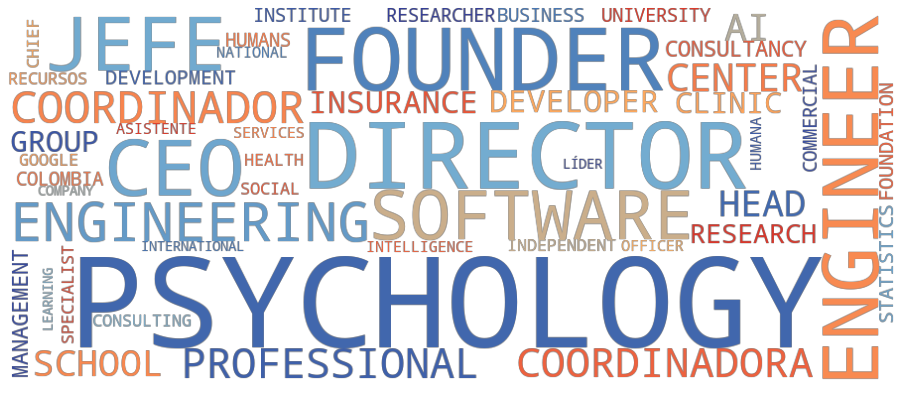

In [160]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,2,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

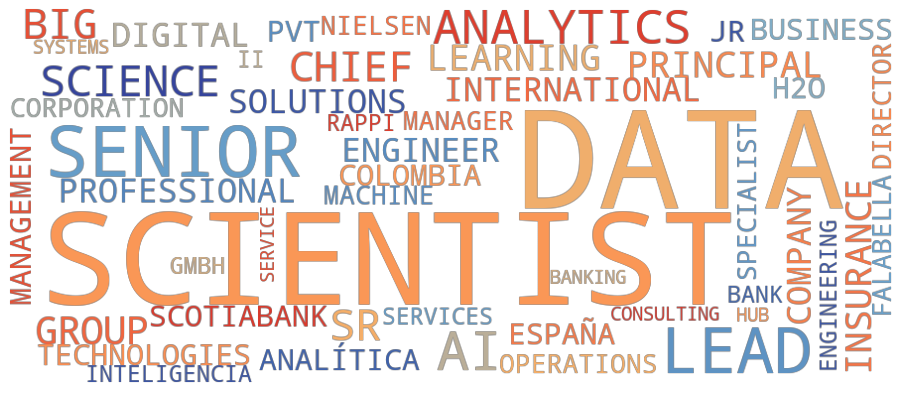

In [162]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,3,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

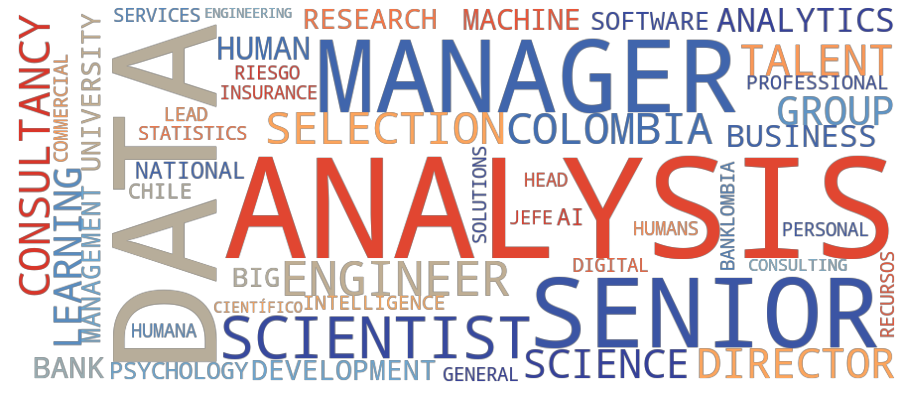

In [164]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,-1,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')